<a href="https://colab.research.google.com/github/abhi10010/Machine-Learning-Google-Colab/blob/master/Stock_Price_Prediction_LSTM_GRU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [2]:
cd gdrive

/content/gdrive


In [3]:
cd 'My Drive'

/content/gdrive/My Drive


In [4]:
cd 'Colab Notebooks'

/content/gdrive/My Drive/Colab Notebooks


In [5]:
cd 'Lambda'

/content/gdrive/My Drive/Colab Notebooks/Lambda


In [6]:
ls

AAL.csv   CAG.csv    DVN.csv    HCN.csv   MA.csv    PGR.csv          TGNA.csv
AAP.csv   CAH.csv    EA.csv     HCP.csv   MAR.csv   PH.csv           TGT.csv
AAPL.csv  CAT.csv    EBAY.csv   HD.csv    MAS.csv   PHM.csv          TIF.csv
ABBV.csv  CB.csv     ECL.csv    HES.csv   MAT.csv   PKI.csv          TJX.csv
ABC.csv   CBG.csv    ED.csv     HIG.csv   MCD.csv   PLD.csv          TMK.csv
ABT.csv   CBS.csv    EFX.csv    HOG.csv   MCHP.csv  PM.csv           TMO.csv
ACN.csv   CCI.csv    EIX.csv    HOLX.csv  MCK.csv   PNC.csv          TRIP.csv
A.csv     CCL.csv    EL.csv     HON.csv   MCO.csv   PNR.csv          TROW.csv
ADBE.csv  C.csv      EMN.csv    HP.csv    M.csv     PNW.csv          TRV.csv
ADI.csv   CELG.csv   EMR.csv    HPE.csv   MDLZ.csv  PPG.csv          TSCO.csv
ADM.csv   CERN.csv   ENDP.csv   HPQ.csv   MDT.csv   PPL.csv          TSN.csv
ADP.csv   CF.csv     EOG.csv    HRB.csv   MET.csv   PRGO.csv         TSO.csv
ADS.csv   CFG.csv    EQIX.csv   HRL.csv   MHK.csv   PRU.csv          TSS

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
plt.style.use('seaborn-whitegrid')

from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from keras.optimizers import SGD
import math
from sklearn.metrics import mean_squared_error

Using TensorFlow backend.


In [8]:
def return_rmse(test,predicted):
    rmse = math.sqrt(mean_squared_error(test, predicted))
    print("The root mean squared error is {}.".format(rmse))

In [9]:
prices = pd.read_csv('Separate_Files/prices.csv')
prices.head()

,date,symbol,open,close,low,high,volume
0,2016-01-05 00:00:00,WLTW,123.430000,125.839996,122.309998,126.250000,2163600.0
1,2016-01-06 00:00:00,WLTW,125.239998,119.980003,119.940002,125.540001,2386400.0
2,2016-01-07 00:00:00,WLTW,116.379997,114.949997,114.930000,119.739998,2489500.0
3,2016-01-08 00:00:00,WLTW,115.480003,116.620003,113.500000,117.440002,2006300.0
4,2016-01-11 00:00:00,WLTW,117.010002,114.970001,114.089996,117.330002,1408600.0


In [10]:
prices.symbol.unique()                          # Check different stock prices

array(['WLTW', 'A', 'AAL', 'AAP', 'AAPL', 'ABC', 'ABT', 'ACN', 'ADBE',
       'ADI', 'ADM', 'ADP', 'ADS', 'ADSK', 'AEE', 'AEP', 'AES', 'AET',
       'AFL', 'AGN', 'AIG', 'AIZ', 'AJG', 'AKAM', 'ALB', 'ALK', 'ALL',
       'ALXN', 'AMAT', 'AME', 'AMG', 'AMGN', 'AMP', 'AMT', 'AMZN', 'AN',
       'ANTM', 'AON', 'APA', 'APC', 'APD', 'APH', 'ARNC', 'ATVI', 'AVB',
       'AVGO', 'AVY', 'AWK', 'AXP', 'AYI', 'AZO', 'BA', 'BAC', 'BAX',
       'BBBY', 'BBT', 'BBY', 'BCR', 'BDX', 'BEN', 'BHI', 'BIIB', 'BK',
       'BLK', 'BLL', 'BMY', 'BSX', 'BWA', 'BXP', 'C', 'CA', 'CAG', 'CAH',
       'CAT', 'CB', 'CBG', 'CBS', 'CCI', 'CCL', 'CELG', 'CERN', 'CF',
       'CHD', 'CHK', 'CHRW', 'CI', 'CINF', 'CL', 'CLX', 'CMA', 'CMCSA',
       'CME', 'CMG', 'CMI', 'CMS', 'CNC', 'CNP', 'COF', 'COG', 'COH',
       'COL', 'COO', 'COP', 'COST', 'CPB', 'CRM', 'CSCO', 'CSX', 'CTAS',
       'CTL', 'CTSH', 'CTXS', 'CVS', 'CVX', 'CXO', 'D', 'DAL', 'DD', 'DE',
       'DFS', 'DG', 'DGX', 'DHI', 'DHR', 'DIS', 'DISCA', 'DISCK', 

In [ ]:
# for i in prices.symbol.unique():                              # Creating separate CSV file for each stock to analyze 
#   df_check = prices['symbol'] == i
#   df = prices[df_check]
#   file_name = i + '.csv'
#   df.to_csv(file_name)
#   !cp file_name "drive/My Drive/Colab Notebooks/Lambda/"      # Copying files to the google drive


cp: cannot stat 'file_name': No such file or directory
cp: cannot stat 'file_name': No such file or directory
cp: cannot stat 'file_name': No such file or directory
cp: cannot stat 'file_name': No such file or directory
cp: cannot stat 'file_name': No such file or directory
cp: cannot stat 'file_name': No such file or directory


In [11]:
df_ = {}
for i in prices.symbol.unique():                       # Creating a dictionary of data of each CSV file
    df_[i] = pd.read_csv(i + ".csv", index_col="date", parse_dates=["date"])          

In [12]:
def split(dataframe, border, col):                     # Function to split into test and train set for each stock on the given year
    return dataframe.loc[:border,col], dataframe.loc[border:,col]

df_new = {}
for i in prices.symbol.unique():                      # Creating a dictionary of test and train data of each CSV file
    df_new[i] = {}
    df_new[i]["Train"], df_new[i]["Test"] = split(df_[i], "2015", "close")

In [13]:
stockList = prices.symbol.unique()                    # Creating a list of all the unique stocks
stockList_new = stockList[0:10]                       
stockList_new

array(['WLTW', 'A', 'AAL', 'AAP', 'AAPL', 'ABC', 'ABT', 'ACN', 'ADBE',
       'ADI'], dtype=object)

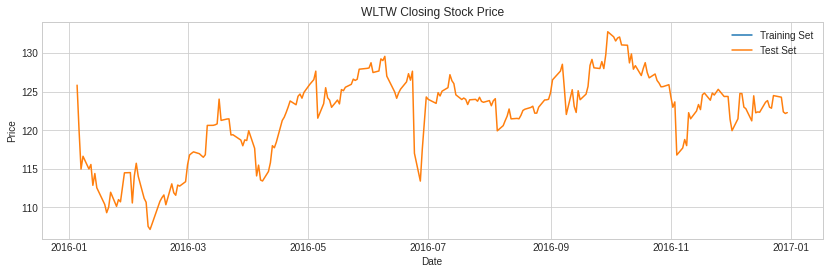

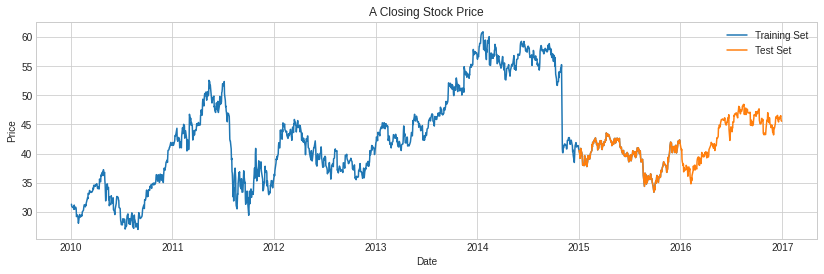

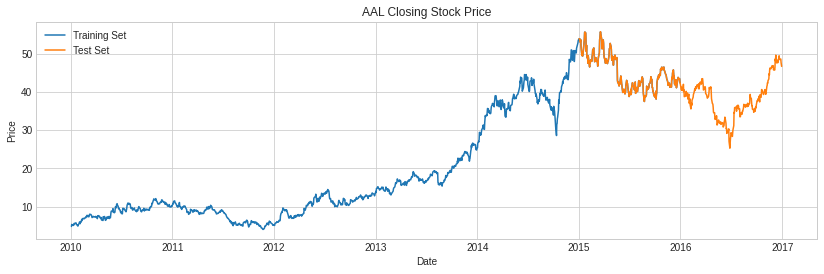

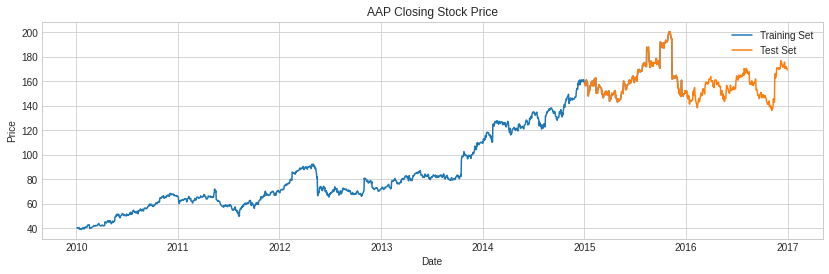

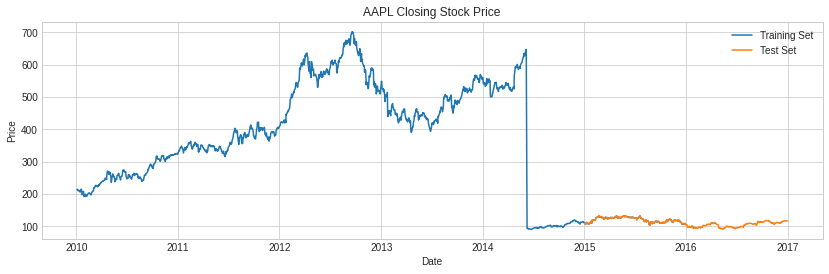

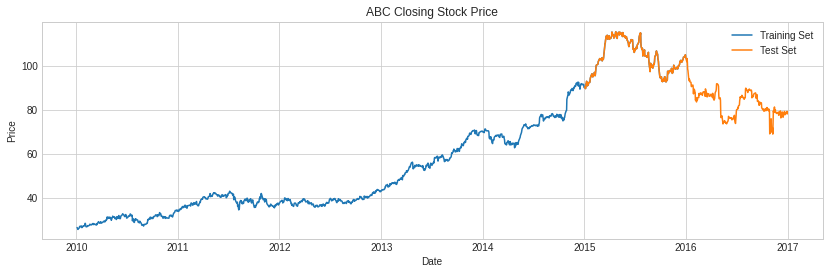

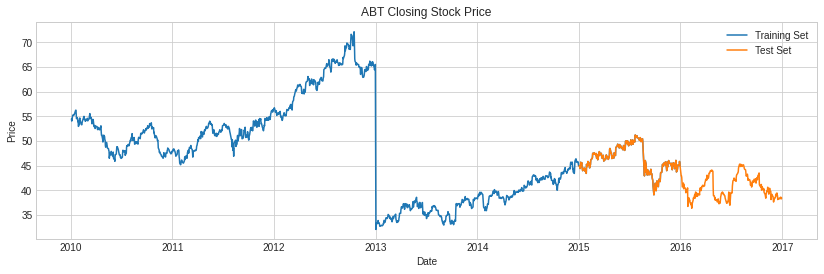

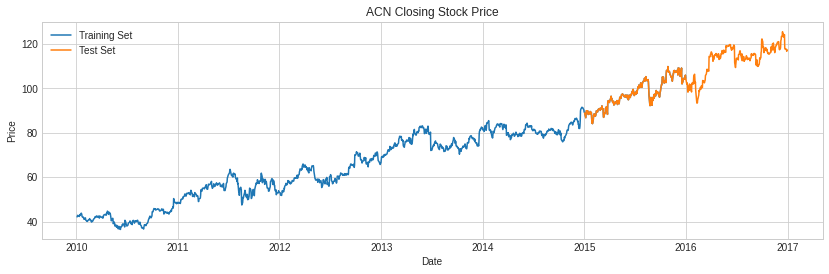

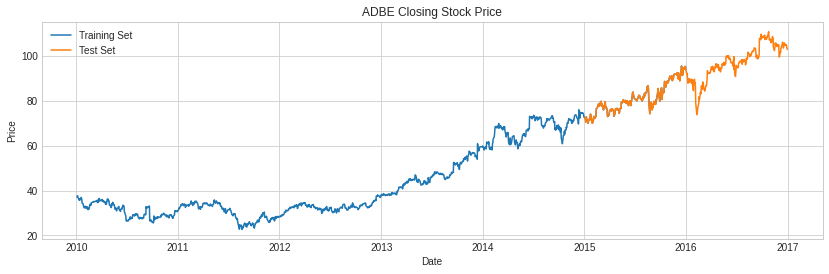

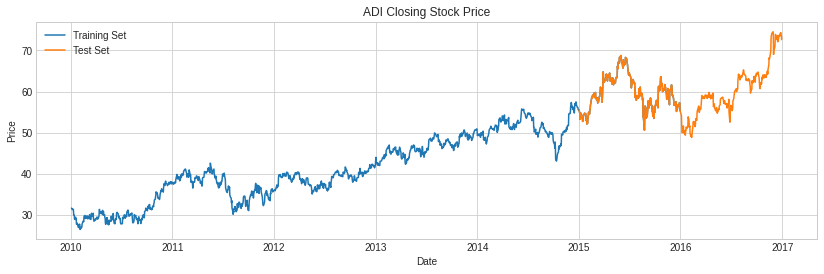

In [14]:
for i in stockList_new:                             # Plotting test and train data of closed stock prices
    plt.figure(figsize=(14,4))
    plt.plot(df_new[i]["Train"])
    plt.plot(df_new[i]["Test"])
    plt.ylabel("Price")
    plt.xlabel("Date")
    plt.legend(["Training Set", "Test Set"])
    plt.title(i + " Closing Stock Price")

In [15]:
transform_train = {}                                 
transform_test = {}
scaler = {}
stockList = np.delete(stockList, 0)
for num, i in enumerate(list(stockList)):             # Feature scaling all the data in the range of 0 to 1
    sc = MinMaxScaler(feature_range=(0,1))
    a0 = np.array(df_new[i]["Train"])
    a1 = np.array(df_new[i]["Test"])
    a0 = a0.reshape(a0.shape[0],1)
    a1 = a1.reshape(a1.shape[0],1)
    if a0.shape != (0,1):
      transform_train[i] = sc.fit_transform(a0)
      transform_test[i] = sc.fit_transform(a1)
      scaler[i] = sc
    
del a0
del a1

In [16]:
for i in transform_train.keys():                      # Displaying shape of all the training data 
    print(i, transform_train[i].shape)
print("\n")    
for i in transform_test.keys():                       # Displaying shape of all the test data
    print(i, transform_test[i].shape)

A (1510, 1)
AAL (1510, 1)
AAP (1510, 1)
AAPL (1510, 1)
ABC (1510, 1)
ABT (1510, 1)
ACN (1510, 1)
ADBE (1510, 1)
ADI (1510, 1)
ADM (1510, 1)
ADP (1510, 1)
ADS (1510, 1)
ADSK (1510, 1)
AEE (1510, 1)
AEP (1510, 1)
AES (1510, 1)
AET (1510, 1)
AFL (1510, 1)
AGN (1510, 1)
AIG (1510, 1)
AIZ (1510, 1)
AJG (1510, 1)
AKAM (1510, 1)
ALB (1510, 1)
ALK (1510, 1)
ALL (1510, 1)
ALXN (1510, 1)
AMAT (1510, 1)
AME (1510, 1)
AMG (1510, 1)
AMGN (1510, 1)
AMP (1510, 1)
AMT (1510, 1)
AMZN (1510, 1)
AN (1510, 1)
ANTM (1510, 1)
AON (1510, 1)
APA (1510, 1)
APC (1510, 1)
APD (1510, 1)
APH (1510, 1)
ARNC (1510, 1)
ATVI (1510, 1)
AVB (1510, 1)
AVGO (1510, 1)
AVY (1510, 1)
AWK (1510, 1)
AXP (1510, 1)
AYI (1510, 1)
AZO (1510, 1)
BA (1510, 1)
BAC (1510, 1)
BAX (1510, 1)
BBBY (1510, 1)
BBT (1510, 1)
BBY (1510, 1)
BCR (1510, 1)
BDX (1510, 1)
BEN (1510, 1)
BHI (1510, 1)
BIIB (1510, 1)
BK (1510, 1)
BLK (1510, 1)
BLL (1510, 1)
BMY (1510, 1)
BSX (1510, 1)
BWA (1510, 1)
BXP (1510, 1)
C (1510, 1)
CA (1510, 1)
CAG (1510, 1)


In [17]:
trainset = {}
testset = {}
for j in stockList[:200]:                             # Splitting the first 200 stock data
    trainset[j] = {}
    X_train = []
    y_train = []
    for i in range(60,1510):                          # Spliting training samples
        X_train.append(transform_train[j][i-60:i,0])  # Training set of the train data 
        y_train.append(transform_train[j][i,0])       # Training set of the test data
    X_train, y_train = np.array(X_train), np.array(y_train)
    trainset[j]["X"] = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))
    trainset[j]["y"] = y_train
    
    testset[j] = {}
    X_test = []
    y_test = []    
    for i in range(60, 504):                          # Spliting testing samples
        X_test.append(transform_test[j][i-60:i,0])    # Testing set of the train data
        y_test.append(transform_test[j][i,0])         # Testing set of the test data
    X_test, y_test = np.array(X_test), np.array(y_test)
    testset[j]["X"] = np.reshape(X_test, (X_test.shape[0], X_train.shape[1], 1))
    testset[j]["y"] = y_test

In [18]:
arr_buff = [] 
for i in stockList[:200]:
    buff = {}
    buff["X_train"] = trainset[i]["X"].shape
    buff["y_train"] = trainset[i]["y"].shape
    buff["X_test"] = testset[i]["X"].shape
    buff["y_test"] = testset[i]["y"].shape
    arr_buff.append(buff)

pd.DataFrame(arr_buff, index=stockList[:200]) # A dataframe for the shapes of different splitted data set 

,X_train,y_train,X_test,y_test
A,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"
AAL,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"
AAP,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"
AAPL,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"
ABC,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"
...,...,...,...,...
GT,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"
GWW,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"
HAL,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"
HAR,"(1450, 60, 1)","(1450,)","(444, 60, 1)","(444,)"


In [19]:
%%time
regressor = Sequential()                      # The LSTM architecture

regressor.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
regressor.add(Dropout(0.2))

regressor.add(LSTM(units=50, return_sequences=True))
regressor.add(Dropout(0.2))

regressor.add(LSTM(units=50, return_sequences=True))
regressor.add(Dropout(0.5))

regressor.add(LSTM(units=50))
regressor.add(Dropout(0.5))

regressor.add(Dense(units=1))                 # Output Layer 

regressor.compile(optimizer='rmsprop', loss='mean_squared_error')



CPU times: user 1.08 s, sys: 723 ms, total: 1.8 s
Wall time: 7.97 s


In [20]:
for i in stockList[:200]:                     #Fitting in the architechture
    print("Fitting to", i)
    regressor.fit(trainset[i]["X"], trainset[i]["y"], epochs=10, batch_size=200)

Fitting to A
Epoch 1/10
1450/1450 [==============================] - 7s 5ms/step - loss: 0.0967
Epoch 2/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0281
Epoch 3/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0270
Epoch 4/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0256
Epoch 5/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0219
Epoch 6/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0192
Epoch 7/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0267
Epoch 8/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0140
Epoch 9/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0222
Epoch 10/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0191
Fitting to AAL
Epoch 1/10
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0081
Epoch 2/10
1450/1450 [==============================] - 5s

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly 

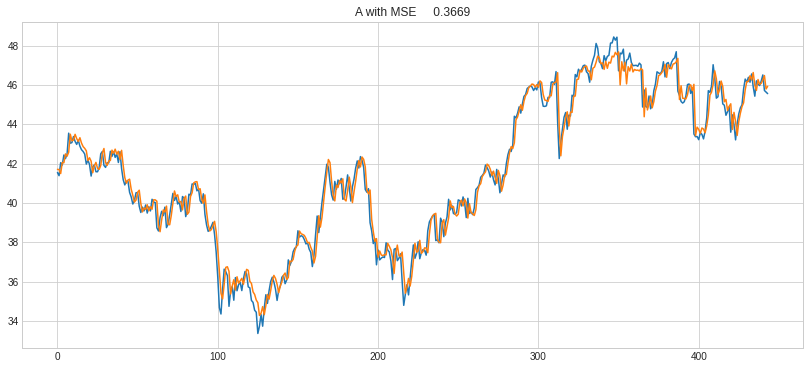

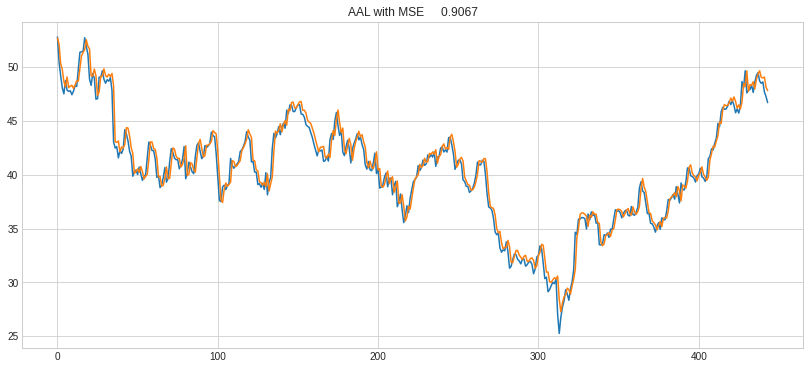

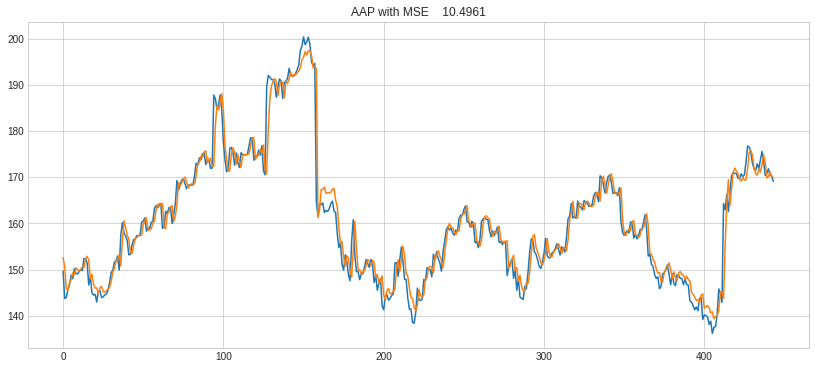

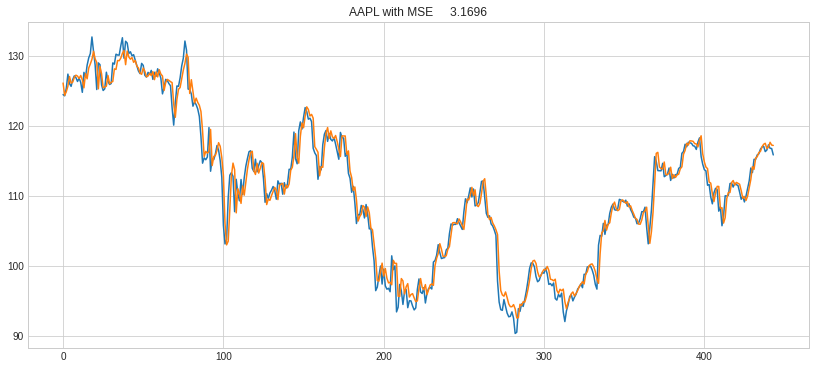

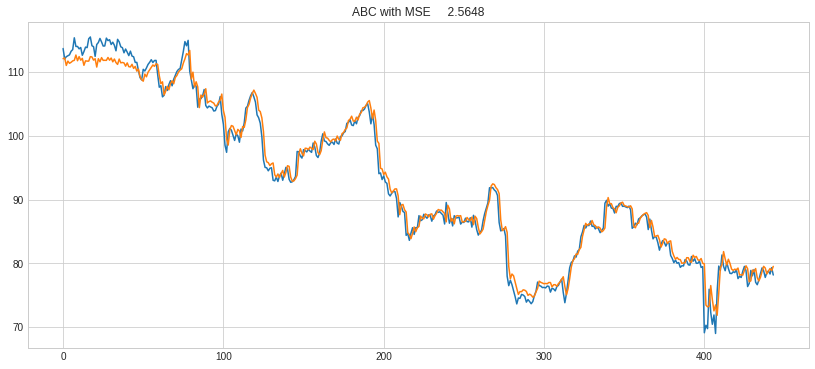

...

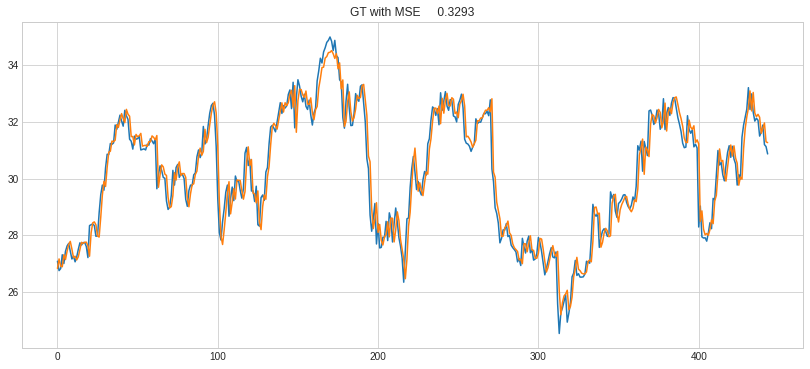

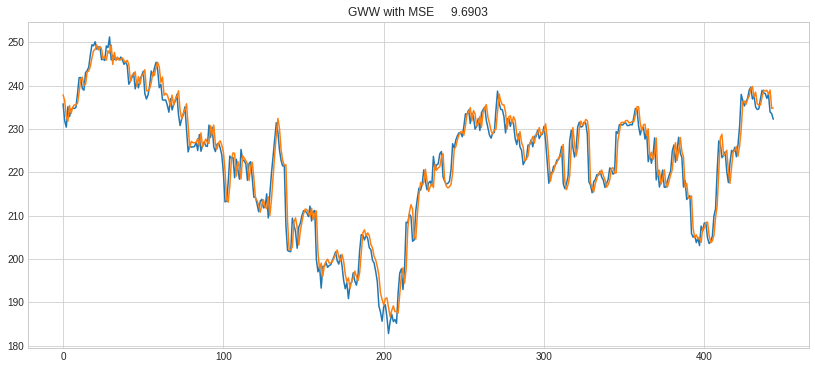

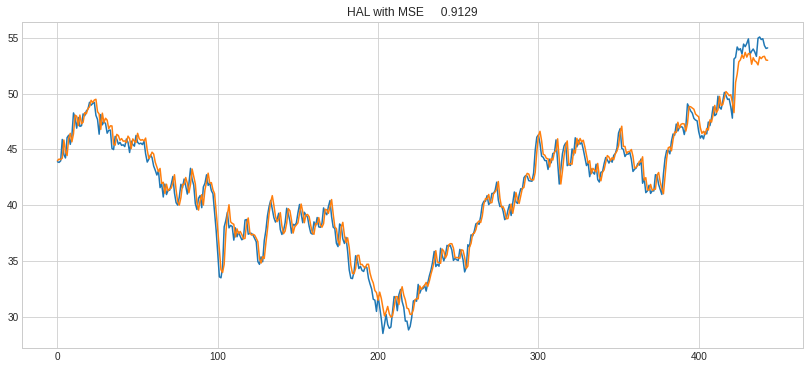

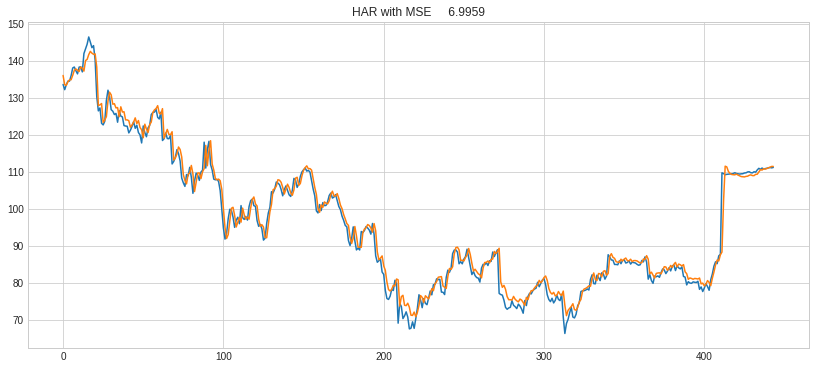

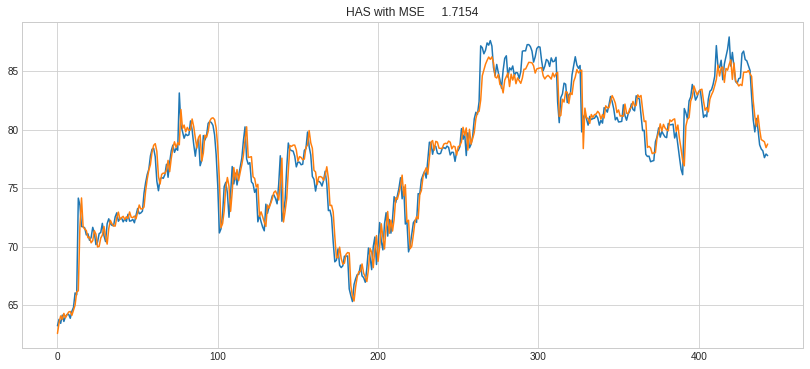

In [21]:
pred_result = {}
for i in stockList[:200]:                       # Predicting and Plotting the results for each top 200 stocks
    y_true = scaler[i].inverse_transform(testset[i]["y"].reshape(-1,1))
    y_pred = scaler[i].inverse_transform(regressor.predict(testset[i]["X"]))
    MSE = mean_squared_error(y_true, y_pred)
    pred_result[i] = {}
    pred_result[i]["True"] = y_true
    pred_result[i]["Pred"] = y_pred
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)

In [22]:
time_index = df_new["A"]["Test"][60:].index
def lagging(df, lag, time_index):                              # Adding a lag of last 5 days' value 
    df_pred = pd.Series(df["Pred"].reshape(-1), index=time_index)
    df_true = pd.Series(df["True"].reshape(-1), index=time_index)
    
    df_pred_lag = df_pred.shift(lag)
    
    print("MSE without Lag", mean_squared_error(np.array(df_true), np.array(df_pred)))
    print("MSE with Lag 5", mean_squared_error(np.array(df_true[:-5]), np.array(df_pred_lag[:-5])))

    plt.figure(figsize=(14,4))
    plt.title("Prediction without Lag")
    plt.plot(df_true)
    plt.plot(df_pred)

    MSE_lag = mean_squared_error(np.array(df_true[:-5]), np.array(df_pred_lag[:-5]))
    plt.figure(figsize=(14,4))
    plt.title("Prediction with Lag")
    plt.plot(df_true)
    plt.plot(df_pred_lag)

MSE without Lag 0.5590368605775778
MSE with Lag 5 1.7501029222523676


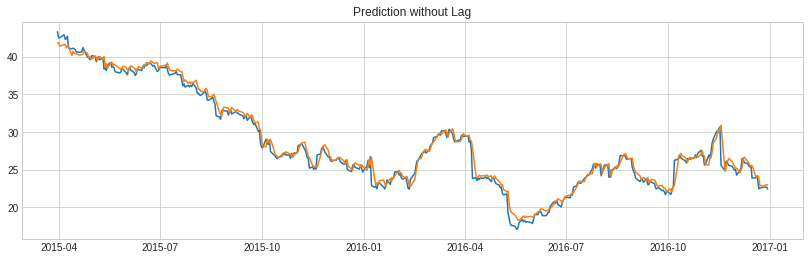

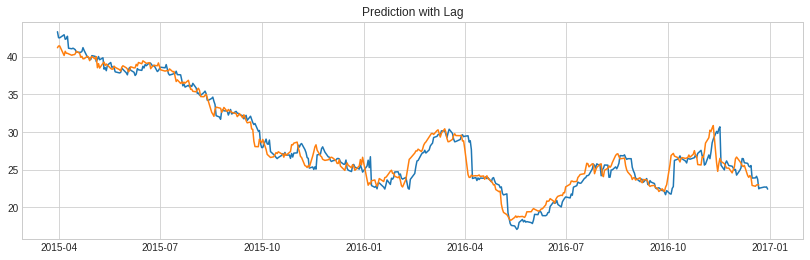

In [23]:
lagging(pred_result["GPS"], -5, time_index)

In [31]:
regressorGRU = Sequential()                       # The GRU architecture

regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))

regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))

regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))

regressorGRU.add(GRU(units=50, activation='tanh'))
regressorGRU.add(Dropout(0.2))

regressorGRU.add(Dense(units=1))                # Output Layer

regressorGRU.compile(optimizer=SGD(lr=0.01, decay=1e-7, momentum=0.9, nesterov=False),loss='mean_squared_error')

for i in stockList[:10]:                        # Fitting to the training set for first 10 stocks
    print("Fitting to", i)
    regressorGRU.fit(trainset[i]["X"], trainset[i]["y"],epochs=50,batch_size=150)

Fitting to A
Epoch 1/50
1450/1450 [==============================] - 6s 4ms/step - loss: 0.1419
Epoch 2/50
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0657
Epoch 3/50
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0449
Epoch 4/50
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0312
Epoch 5/50
1450/1450 [==============================] - 5s 4ms/step - loss: 0.0208
Epoch 6/50
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0129
Epoch 7/50
1450/1450 [==============================] - 5s 4ms/step - loss: 0.0083
Epoch 8/50
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0059
Epoch 9/50
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0053
Epoch 10/50
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0050
Epoch 11/50
1450/1450 [==============================] - 5s 3ms/step - loss: 0.0047
Epoch 12/50
1450/1450 [==============================] - 5s 3ms/step - l

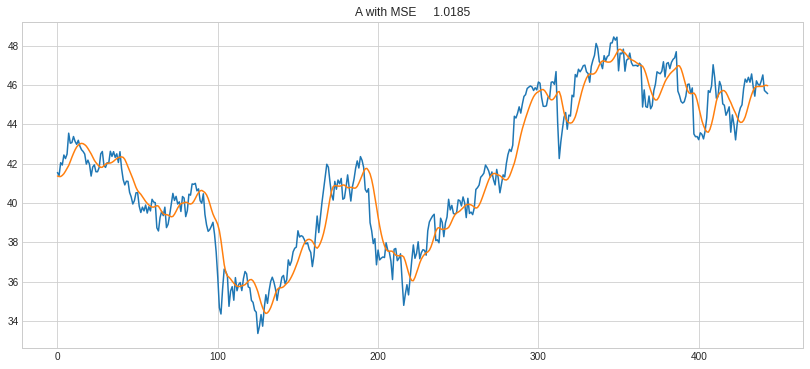

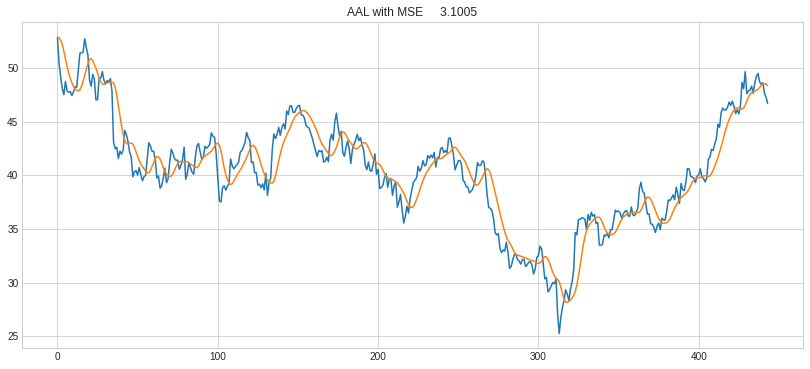

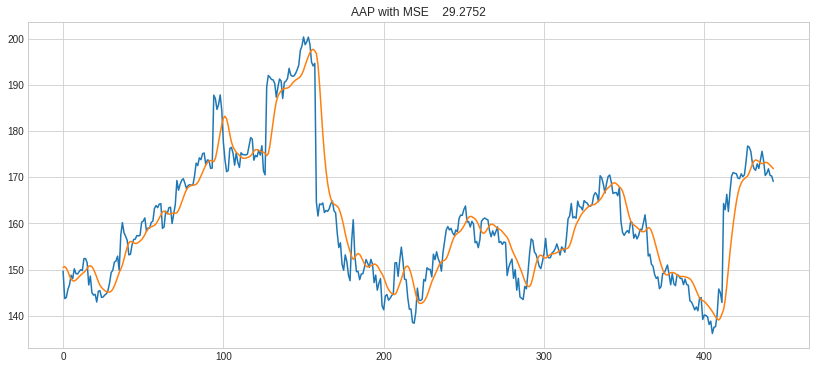

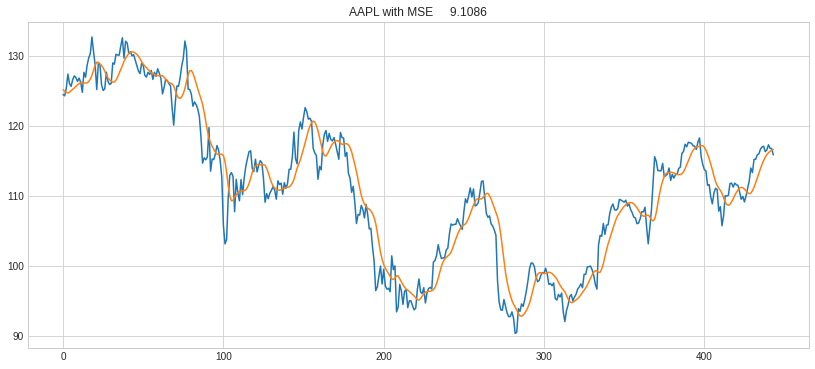

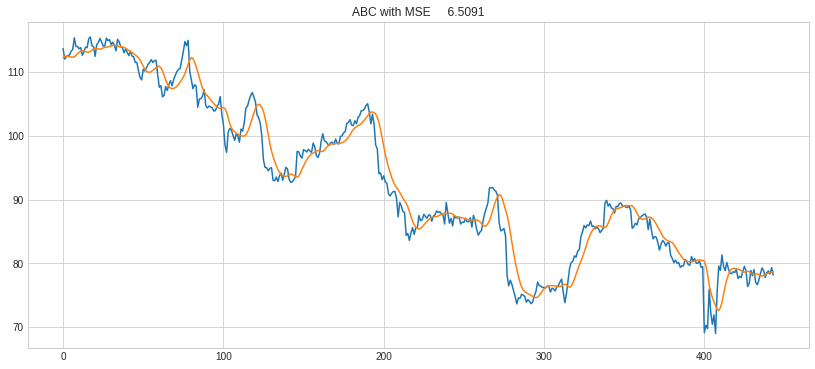

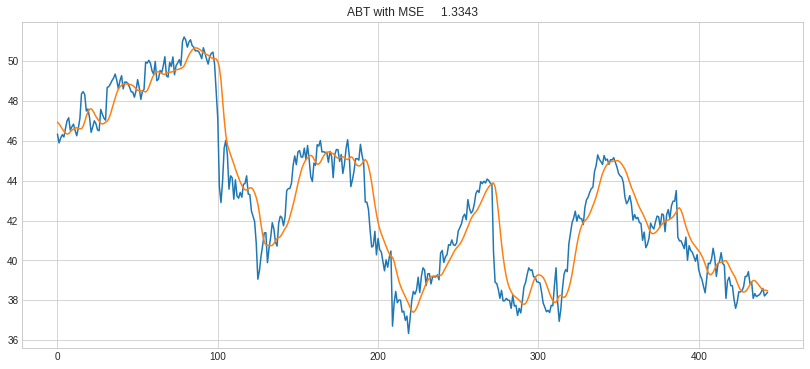

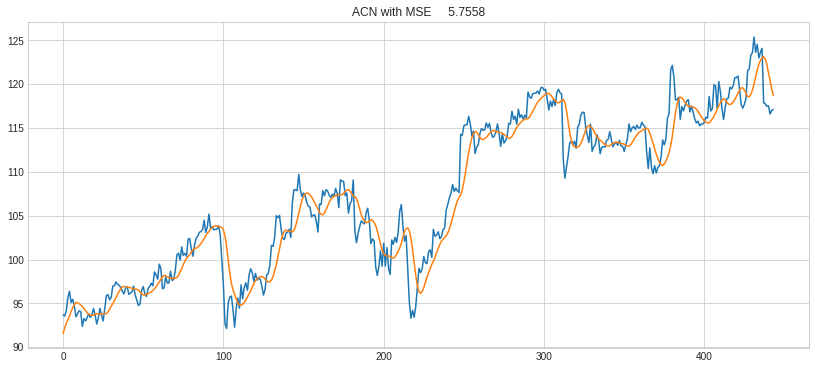

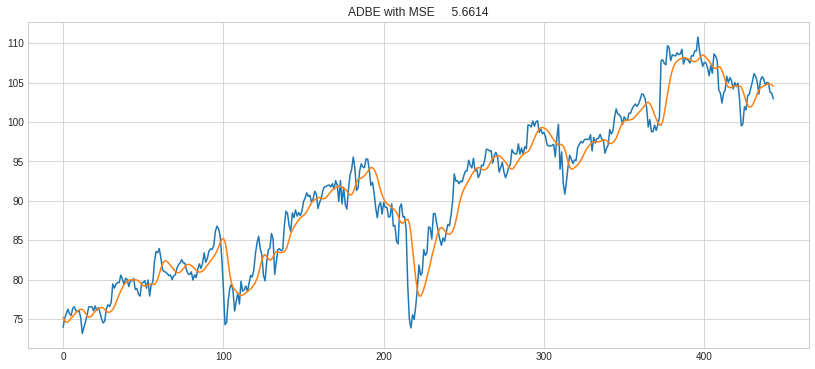

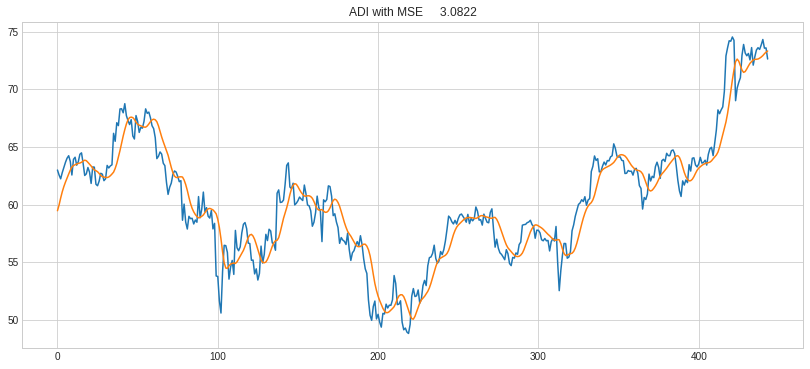

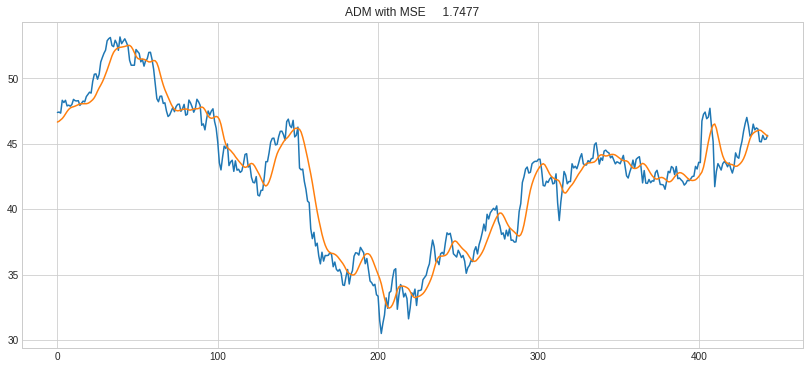

In [32]:
for i in stockList[:10]:                              # Predicting and Plotting the results for each top 10 stocks
    y_true = scaler[i].inverse_transform(testset[i]["y"].reshape(-1,1))
    y_pred = scaler[i].inverse_transform(regressorGRU.predict(testset[i]["X"]))
    MSE = mean_squared_error(y_true, y_pred)
    
    plt.figure(figsize=(14,6))
    plt.title("{} with MSE {:10.4f}".format(i,MSE))
    plt.plot(y_true)
    plt.plot(y_pred)